# **<font color = red>Figures and analysis</font>** 

This notebook contains scripts for producing the main figures and results accompanying the manuscript. Here we perform basic organization and processing of data, which is then passed to functions in **figures.py** (available at this GitHub repository) for detailed formatting. The figures produced are stored as PDFs in the **/figures** folder.

## **Contents**

- ### [Libraries and variables](#lib)
- ### Figures and data analysis
    - [Figure 1](#Figure_1) Evolutionary path for a 20-site time-varying model (binary)
    - [Figure 2](#Figure_2) Histogram
    - [Figure 3](#Figure_3) Time varying trait coefficients for all HIV data   
    - [Figure 4](#Figure_4) Time varying trait coefficients for HIV data CH077-3
    - [Figure 5](#Figure_5) Time varying trait coefficients for HIV data CH256-3
    - [Figure 6](#Figure_6) Time varying trait coefficients for HIV data CH256-5
    - [Figure 7](#Figure_7) Time varying trait coefficients for HIV data CH470-5
    - [Figure 8](#Figure_8) Time varying trait coefficients for HIV data CH040-3

<a id='lib'></a>
### Libraries and variables

In [1]:
# Full library list and version numbers

print('This notebook was prepared using:')

import sys, os
from copy import deepcopy
from importlib import reload
print('python version %s' % sys.version)

import numpy as np
print('numpy version %s' % np.__version__)

import scipy as sp
print('scipy version %s' % sp.__version__)

import pandas as pd
print('pandas version %s' % pd.__version__)

import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
print('matplotlib version %s' % matplotlib.__version__)

import seaborn as sns
import re
import math
from dataclasses import dataclass
import json

import importlib
import figures as fig
import mplot as mp

# GitHub directories
HIV_DIR = 'data/HIV'
MPL_DIR = 'src/MPL'
SIM_DIR = 'data/simulation'
FIG_DIR = 'figures'

# Standard color scheme

BKCOLOR  = '#252525'
C_BEN    = '#EB4025'
C_BEN_LT = '#F08F78'
C_NEU    = '#969696'
C_NEU_LT = '#E8E8E8'
C_DEL    = '#3E8DCF'
C_DEL_LT = '#78B4E7'

# paper style
FONTFAMILY   = 'Arial'
SIZESUBLABEL = 8
SIZELABEL    = 6
SIZETICK     = 6
SMALLSIZEDOT = 6.
SIZELINE     = 0.6

GOLDR        = (1.0 + np.sqrt(5)) / 2.0
TICKLENGTH   = 3
TICKPAD      = 3
AXWIDTH      = 0.4

FIGPROPS = {
    'transparent' : True,
    #'bbox_inches' : 'tight'
}

DEF_ERRORPROPS = {
    'mew'        : AXWIDTH,
    'markersize' : SMALLSIZEDOT/2,
    'fmt'        : 'o',
    'elinewidth' : SIZELINE/2,
    'capthick'   : 0,
    'capsize'    : 0
}

DEF_LABELPROPS = {
    'family' : FONTFAMILY,
    'size'   : SIZELABEL,
    'color'  : BKCOLOR
}

DEF_SUBLABELPROPS = {
    'family'  : FONTFAMILY,
    'size'    : SIZESUBLABEL+1,
    'weight'  : 'bold',
    'ha'      : 'center',
    'va'      : 'center',
    'color'   : 'k',
    'clip_on' : False
}

This notebook was prepared using:
python version 3.10.9 | packaged by conda-forge | (main, Feb  2 2023, 20:26:08) [Clang 14.0.6 ]
numpy version 1.24.2
scipy version 1.10.1
pandas version 1.5.3
matplotlib version 3.7.1


<a id='Figure_1'></a>
### Figure 1. Evolutionary path for a 20-site time-varying model
4 beneficial sites 0.02, 4 delterious sites -0.02\
polygenic information is noted in the figure

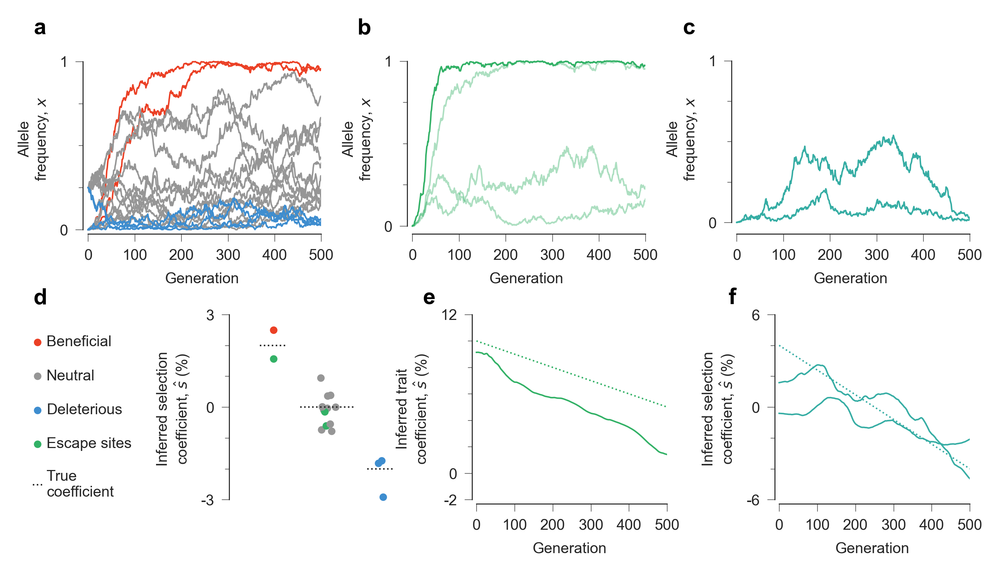

In [5]:
import importlib
importlib.reload(fig)

'Binary case'
generations = 500
fn = np.zeros(generations+1)
fi = np.zeros(generations+1)

for t in range(len(fn)):
    fi[t] = 0.04 - 0.08/generations * t
    fn[t] = 0.1  - 0.05/generations * t

with open("%s/escape_groups.dat"%SIM_DIR, 'r') as file:
    escape_groups = json.load(file)

with open("%s/special_groups.dat"%SIM_DIR, 'r') as file:
    special_groups = json.load(file)

k = 10

pdata = {  
    'NUC':           ['A', 'T'],       # all possible alleles                              
    'name':          str(k),           # output file name
    'seq_length':    20,               # sequence length
    'pop_size':      1000,             # population size
    'generations':   generations,      # number of total generations
    'n_ben':         4,                # number of beneficial mutations
    'n_del':         4,                # number of deleterious mutations
    's_ben':         0.02,             # selection coefficient of beneficial mutations
    's_del':         -0.02,            # selection coefficient of deleterious mutations
    'escape_group':  escape_groups[k], # escape sites
    'p_sites':       special_groups[k],# special sites (not escape sites but still time-varying)
    'fn':            fn,               # time-varying selection coefficient
    'fi':            fi,               # time-varying selection coefficient
    'binary':        'True',
    'ytick_e':       [-0.02,0,0.12],
    'yminorticks_e': [0.02,0.04,0.06,0.08,0.10],
    'ytick_f':       [-0.06,0,0.06],
    'yminorticks_f': [-0.04, -0.02, 0.02, 0.04],
    }

fig.plot_simulation(**pdata)
plt.show()

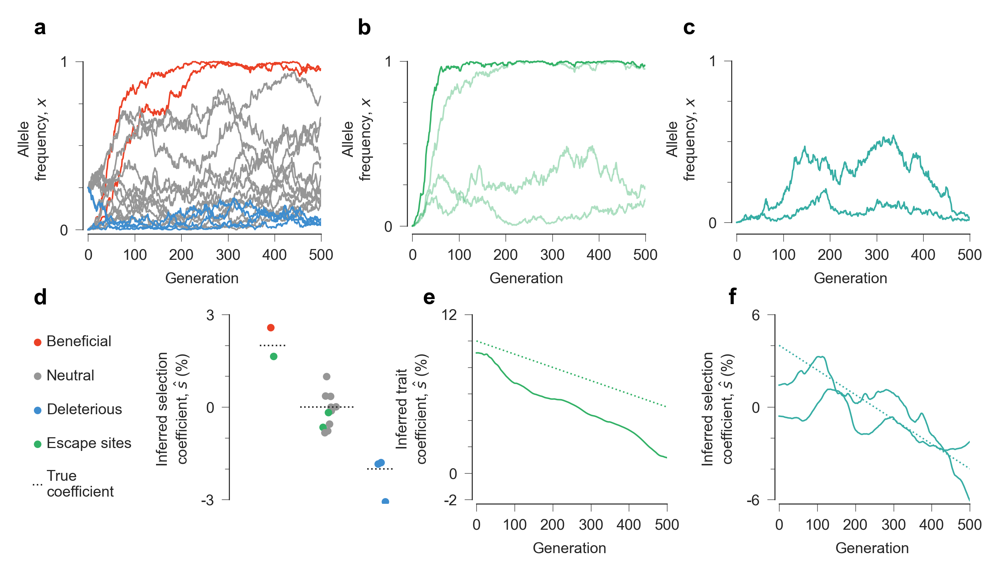

In [6]:
pdata['binary']=False
fig.plot_simulation(**pdata)
plt.show()

In [9]:
n_sim = 100
for k in range(n_sim):
    pdata['name']=str(k)
    pdata['escape_group']=escape_groups[k]
    pdata['p_sites']=special_groups[k]
    pdata['binary']= 'True'
    fig.plot_simulation(**pdata)
    plt.close()
    pdata['binary']='False'
    fig.plot_simulation(**pdata)
    plt.close()

In [45]:
importlib.reload(fig)

'Binary case'
generations = 500
fn = np.zeros(generations+1)
fi = np.zeros(generations+1)

for t in range(len(fn)):
    fi[t] = 0.04 - 0.08/generations * t
    fn[t] = 0.1  - 0.05/generations * t

pdata = {  
    'NUC':           ['A', 'C'],      # all possible alleles                              
    'seq_length':    20,              # sequence length
    'pop_size':      1000,            # population size
    'generations':   generations,     # number of total generations
    'n_ben':         4,               # number of beneficial mutations
    'n_del':         4,               # number of deleterious mutations
    's_ben':         0.02,            # selection coefficient of beneficial mutations
    's_del':         -0.02,           # selection coefficient of deleterious mutations
    'fn':            fn,              # time-varying selection coefficient
    'fi':            fi,              # time-varying selection coefficient
    'binary':        'True',
    'ytick_e':       [-0.04,    0, 0.04, 0.08, 0.12],
    'yminorticks_e': [-0.02, 0.02, 0.06, 0.10],
    'ytick_f':       [-0.06,0,0.06],
    'yminorticks_f': [-0.04,-0.02,0.02,0.04],
    }

fig.plot_his_sim(**pdata)
plt.show()

In [44]:
importlib.reload(fig)

'Multiple case'
generations = 500
fn = np.zeros(generations+1)
fi = np.zeros(generations+1)

for t in range(len(fn)):
    fi[t] = 0.04 - 0.08/generations * t
    fn[t] = 0.1  - 0.05/generations * t

pdata = {  
    'NUC':           ['A', 'C'],      # all possible alleles                              
    'seq_length':    20,              # sequence length
    'pop_size':      1000,            # population size
    'generations':   generations,     # number of total generations
    'n_ben':         4,               # number of beneficial mutations
    'n_del':         4,               # number of deleterious mutations
    's_ben':         0.02,            # selection coefficient of beneficial mutations
    's_del':         -0.02,           # selection coefficient of deleterious mutations
    'fn':            fn,              # time-varying selection coefficient
    'fi':            fi,              # time-varying selection coefficient
    'binary':        'False',
    'ytick_e':       [-0.04,    0, 0.04, 0.08, 0.12],
    'yminorticks_e': [-0.02, 0.02, 0.06, 0.10],
    'ytick_f':       [-0.06,0,0.06],
    'yminorticks_f': [-0.04,-0.02,0.02,0.04],
    }

fig.plot_his_sim(**pdata)
plt.show()


<a id='Figure_3'></a>
###  Time varying trait coefficients for all HIV data   

In [15]:
importlib.reload(fig)

infer_tags = ['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
              '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
              '703010256-3','703010256-5','704010042-5','705010162-3','705010162-5',
              '705010185-5','705010198-3','706010164-3','706010164-5'] #'704010042-3',

# short_tags = ['700010470-3','700010470-5','703010159-3','703010256-3','703010256-5','704010042-3',
#               '704010042-5','705010162-3','705010162-5','706010164-3','706010164-5']


pdata = {                              
    'name':          '',       # input file name
    'output':        '',       # output file name
    'FIG_DIR':   'figures_general',
    'xtick':     [],
    'xminortick':[],
    'ytick':     [],
    'yminortick':[],
    'ytick_sp':  [],
    'yminor_sp': [],
        }

for tag in infer_tags:
    pdata['tag'] = tag
    pdata['HIV_DIR'] = 'data/HIV'
    pdata['output'] = ''
    fig.plot_epitope(**pdata)
    plt.close()    
    fig.plot_special_site(**pdata)
    plt.close()
#     if tag in short_tags:
#         pdata['HIV_DIR'] = 'data/HIV200'
#         pdata['output'] = '-short'
#         fig.plot_epitope(**pdata)
#         plt.close()    
#         fig.plot_special_site(**pdata)
#         plt.close()

CH040-5 does not contain any trait group
CH058-3 has no special site
CH058-5 does not contain any trait group
CH077-3 has no special site
CH077-5 does not contain any trait group
CH607-3 has no special site
CH159-3 has no special site
CH042-5 does not contain any trait group
CH185-5 has no special site
CH198-3 has no special site
CH164-5 does not contain any trait group


In [31]:
importlib.reload(fig)

infer_tags = ['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
              '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
              '703010256-3','703010256-5','704010042-5','705010162-3','705010162-5',
              '705010185-5','705010198-3','706010164-3','706010164-5'] #'704010042-3',

pdata = {                              
    'dir':       'output',       # input file name
    'FIG_DIR':   'figures/HIV',
    'HIV_DIR':   'data/HIV',
    'xtick':     [],
    'xminortick':[],
    'ytick':     [],
    'yminortick':[],
    'ytick_sp':  [],
    'yminor_sp': [],
    }

for tag in infer_tags:
    pdata['tag'] = tag
#     fig.plot_epitope(**pdata)
#     plt.close() 
    fig.plot_special_site(**pdata)
    plt.close()


CH058-3 has no special site
CH077-3 has no special site
CH607-3 has no special site
CH159-3 has no special site
CH185-5 has no special site
CH198-3 has no special site


<a id='Figure_5'></a>
### Time varying trait coefficients for HIV data CH256-3

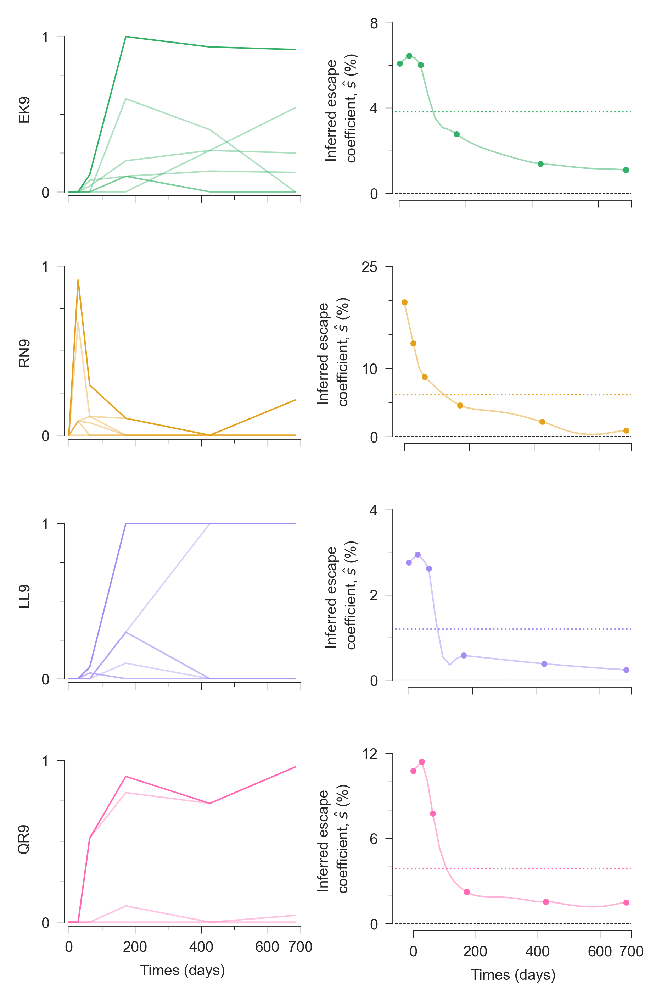

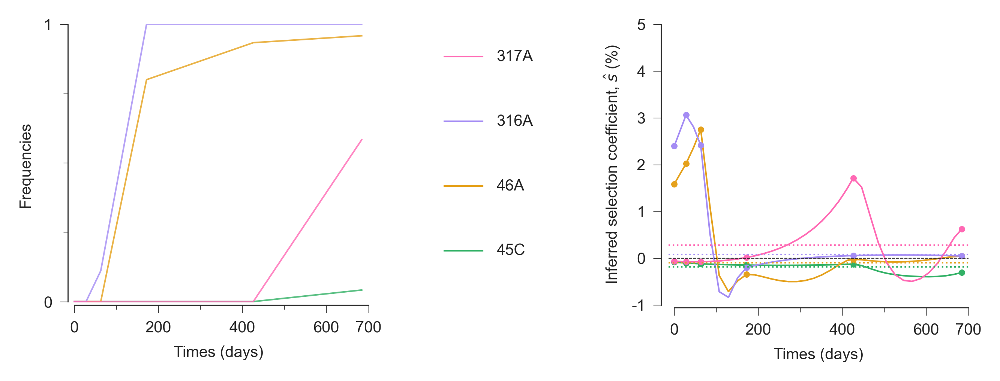

In [33]:
importlib.reload(fig)

pdata = {                    
    'tag':       '703010256-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [0,200,400,600,700],
    'xminortick':[100,300,500],
    'ytick':     [[0,0.04,0.08],[0,0.10,0.25],[0,0.02,0.04],[0,0.06,0.12]],
    'yminortick':[[0.02,0.06],[0.05,0.15,0.20,],[0.01,0.03],[0.02,0.04,0.08,0.10]],
    'ytick_sp':  [-0.01,0,0.01,0.02,0.03,0.04,0.05],
    'yminor_sp': [],
        }

fig.plot_epitope(**pdata)
fig.plot_special_site(**pdata)

# short time
# pdata['HIV_DIR'] = 'data/HIV200'
# pdata['output'] = '-short'
# pdata['xtick']= [0,60,120,180]
# pdata['xminortick'] = [30,90,150]
# pdata['ytick']= [[0,0.02,0.04],[0,0.05,0.10],[0,0.01,0.02,0.03]]
# pdata['yminortick']= [[0.01,0.03],[],[]]
# pdata['ytick_sp']= [-0.01,0,0.02,0.07]
# pdata['yminor_sp']= [0.01,0.03,0.04,0.05,0.06]
# fig.plot_epitope(**pdata)
# fig.plot_special_site(**pdata)

<a id='Figure_8'></a>
### Time varying trait coefficients for HIV data CH040-3

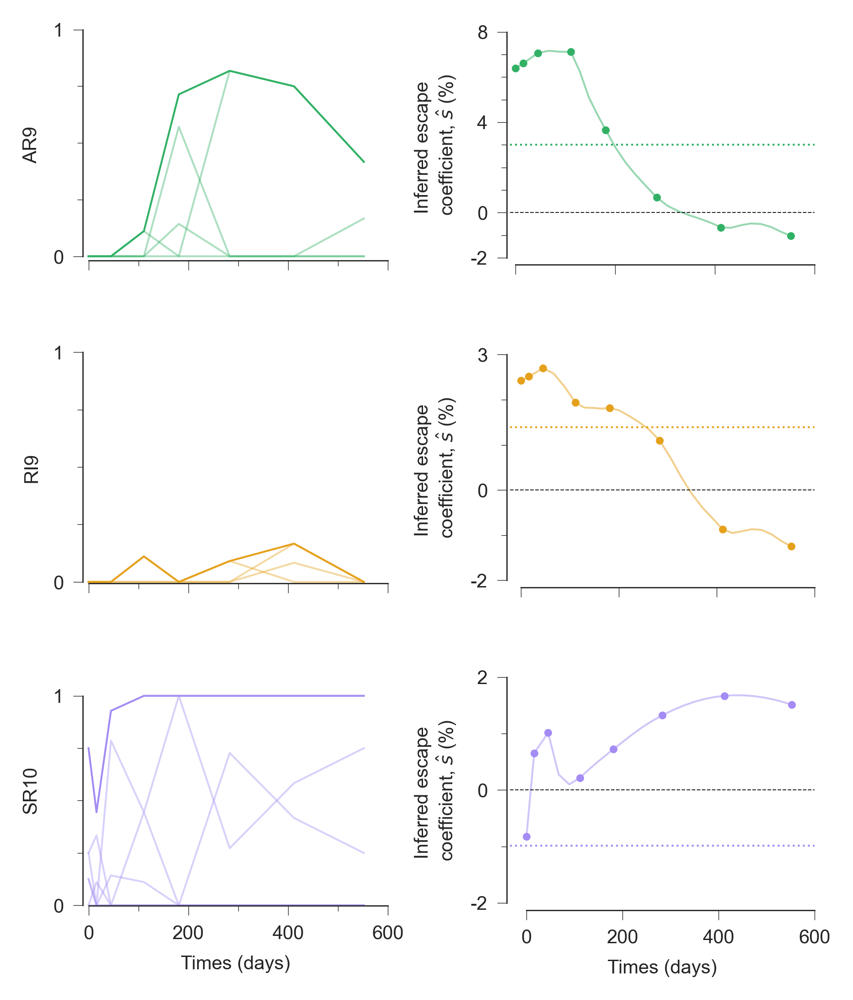

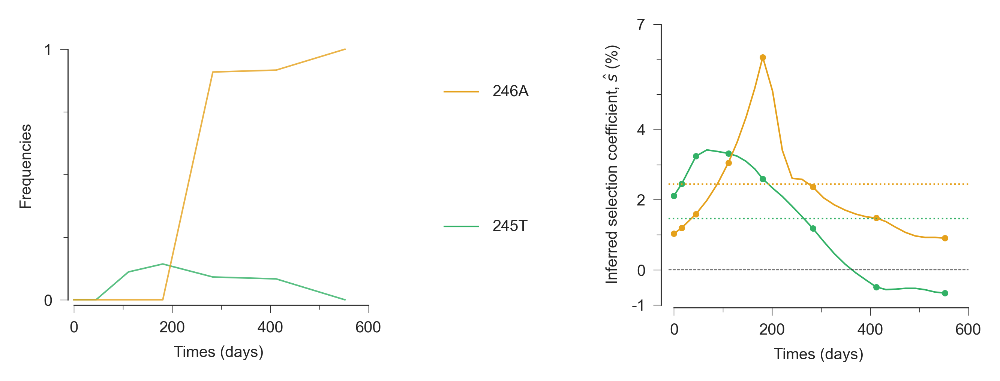

In [38]:
importlib.reload(fig)

pdata = {
    'tag':       '700010040-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [0,200,400,600],
    'xminortick':[100,300,500],
    'ytick':     [[-0.02,0,0.04,0.08],[-0.02,0,0.03],[-0.02,0,0.02]],
    'yminortick':[[-0.01,0.01,0.02,0.03,0.05,0.06,0.07],[-0.01,0.01,0.02],[-0.01,0.01]],
    'ytick_sp':  [-0.01,0,0.02,0.04,0.07],
    'yminor_sp': [0.01,0.03,0.05,0.06],
        }

fig.plot_epitope(**pdata)
fig.plot_special_site(**pdata)

CH040-5 does not contain any trait group
CH058-5 does not contain any trait group
CH077-5 does not contain any trait group
CH042-5 does not contain any trait group
CH164-5 does not contain any trait group


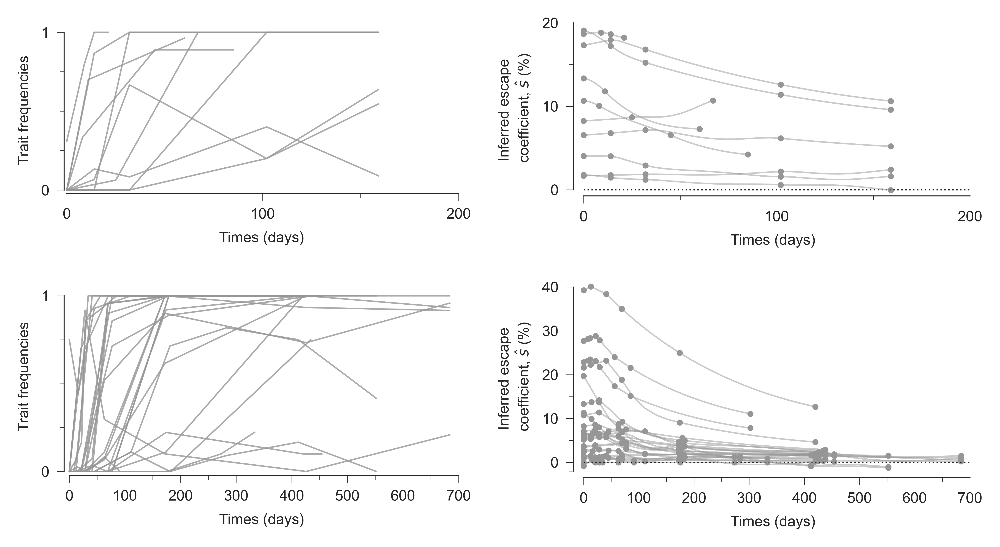

In [40]:
importlib.reload(fig)

C_NEU    = '#969696'

pdata = {                    
    'tags':   ['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
              '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
              '703010256-3','703010256-5','704010042-5','705010162-3','705010162-5',
              '705010185-5','705010198-3','706010164-3','706010164-5'],
    'HIV_DIR':   'data/HIV',
    'name':      '',               # input file name
    'output':    '',               # output file name
}

fig.plot_all_epitopes(**pdata)

<a id='Figure_4'></a>
### Time varying trait coefficients for HIV data CH077-3

CH077-3 has no special site


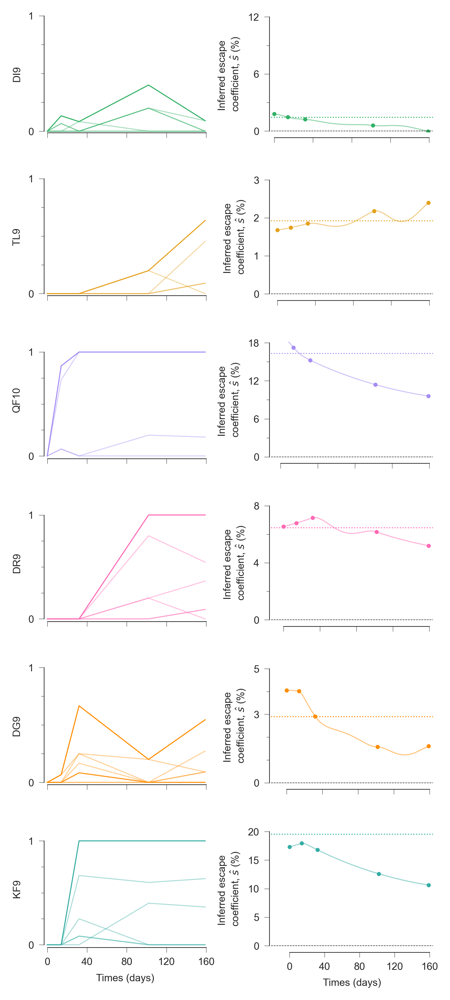

In [35]:
importlib.reload(fig)

pdata = {                    
    'tag':       '700010077-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [0,40,80,120,160],
    'xminortick':[],
    'ytick':     [[0,0.06,0.12],[0,0.01,0.02,0.03],[0,0.06,0.12,0.18],[0,0.04,0.08],\
                  [0,0.03,0.05],[0,0.05,0.10,0.15,0.20]],
    'yminortick':[[0.03,0.09],[],[0.03,0.09,0.15],[0.02,0.06],[0.01,0.02,0.04],[]],
    'ytick_sp':  [],
    'yminor_sp': [],
        }

fig.plot_epitope(**pdata)
fig.plot_special_site(**pdata)

<a id='Figure_6'></a>
### Time varying trait coefficients for HIV data CH256-5

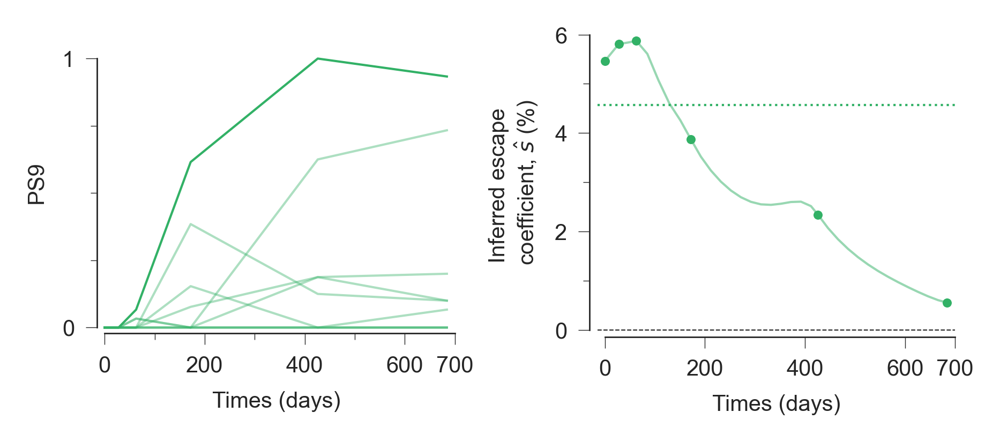

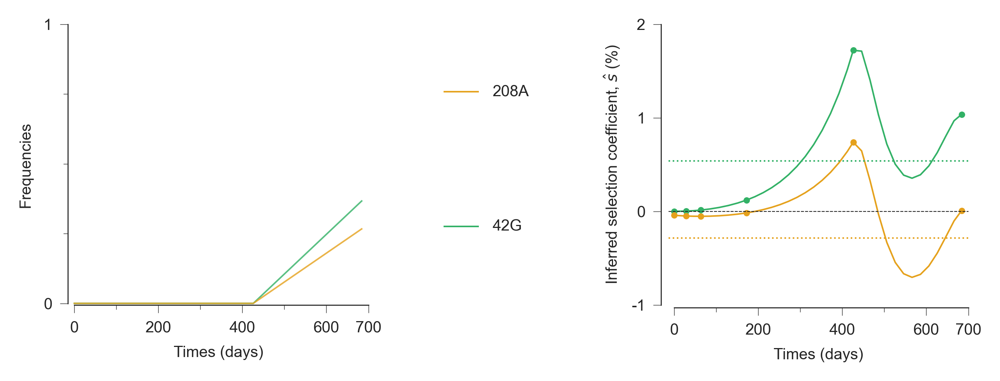

In [36]:
importlib.reload(fig)

pdata = {
    'tag':       '703010256-5',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [0,200,400,600,700],
    'xminortick':[100,300,500],
    'ytick':     [[0,0.02,0.04,0.06]],
    'yminortick':[[0.01,0.03,0.05]],
    'ytick_sp':  [-0.01,0,0.01,0.02],
    'yminor_sp': [],
        }

fig.plot_epitope(**pdata)
fig.plot_special_site(**pdata)

# pdata['HIV_DIR'] = 'data/HIV200'
# pdata['output'] = '-short'
# pdata['xtick']= [0,60,120,180]
# pdata['xminortick'] = [30,90,150]
# pdata['ytick']= [[0,0.02,0.04,0.06]]
# pdata['yminortick']= [[0.01,0.03,0.05]]
# pdata['ytick_sp']= []
# pdata['yminor_sp']= []
# fig.plot_epitope(**pdata)
# fig.plot_special_site(**pdata)

<a id='Figure_7'></a>
### Time varying trait coefficients for HIV data CH470-5

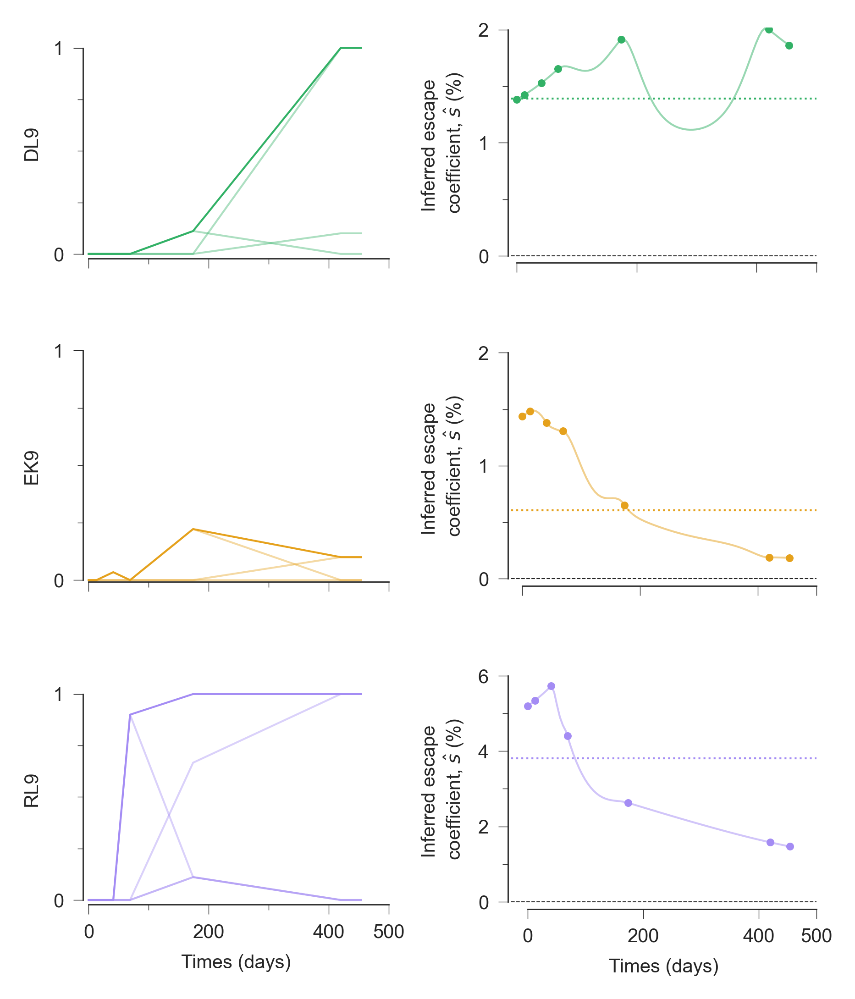

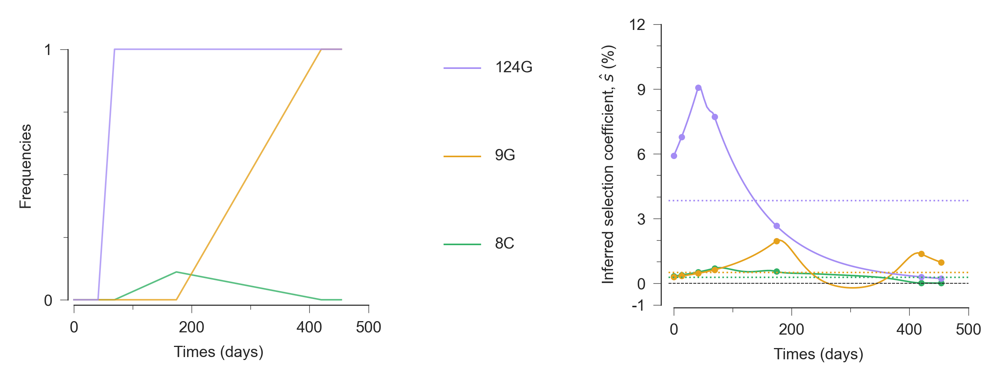

In [37]:
importlib.reload(fig)

pdata = {
    'tag':       '700010470-5',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [0,200,400,500],
    'xminortick':[100,300],
    'ytick':     [[0,0.01,0.02],[0,0.01,0.02],[0,0.02,0.04,0.06]],
    'yminortick':[[0.005,0.015],[0.005,0.015],[0.01,0.03,0.05]],
    'ytick_sp':  [-0.01,0,0.03,0.06,0.09,0.12],
    'yminor_sp': [0.01,0.02,0.04,0.05,0.07,0.08,0.10,0.11],
        }

fig.plot_epitope(**pdata)
fig.plot_special_site(**pdata)

# pdata['HIV_DIR'] = 'data/HIV200'
# pdata['output'] = '-short'
# pdata['xtick']= [0,60,120,180]
# pdata['xminortick'] = [30,90,150]
# pdata['ytick']= [[0,0.02,0.04,0.06]]
# pdata['yminortick']= [[0.01,0.03,0.05]]
# pdata['ytick_sp']= [0,0.04,0.08]
# pdata['yminor_sp']= [0.02,0.06]
# fig.plot_epitope(**pdata)
# fig.plot_special_site(**pdata)

$$\psi$$

1:#32b166
2:#e5a11c
3:#a48cf4
4:#ff69b4
5:#ff8c00
6:#36ada4
7:#f0e54b


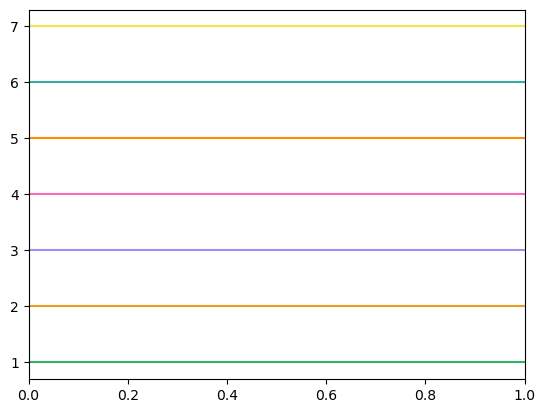

In [54]:
C_group  = ['#32b166','#e5a11c', '#a48cf4','#ff69b4','#ff8c00','#36ada4','#f0e54b']
    
for n in range(len(C_group)):
    plt.axhline(y=n+1, color=C_group[n])
    color_n = mcolors.to_hex(C_group[n])
    print(f'{n+1}:{color_n}')